<a href="https://colab.research.google.com/github/turab45/mastering-pytorch-and-pytorch-lightining-/blob/master/Conditional_GAN_Pytorc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from tqdm import tqdm


print("GPU Available: {}".format(torch.cuda.is_available()))

GPU Available: True


In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [13]:
class Discriminator(nn.Module):
  def __init__(self, channels_img, features_d, num_classes, img_size):
    super(Discriminator, self).__init__()
    self.img_size = img_size

    self.disc = nn.Sequential(
        # Input: N x img_dim x 64 x 64
        nn.Conv2d(channels_img + 1, features_d, kernel_size=4, stride=2, padding=1), #32x32
        nn.LeakyReLU(0.2),
        self._block(features_d, features_d*2, 4, 2, 1), #16x16
        self._block(features_d*2, features_d*4, 4, 2, 1), #8x8
        self._block(features_d*4, features_d*8, 4, 2, 1), #4x4
        nn.Conv2d(features_d*8, 1, kernel_size=4, stride=2, padding=0), #1x1
        nn.Sigmoid(),
    )

    self.embed = nn.Embedding(num_classes, img_size*img_size)

  def _block(self, in_channels, out_channels, kernel_size, stride, padding):
    return nn.Sequential(
        nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size,
            stride,
            padding,
            bias=False, # because we use the BatchNorm
        ),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(0.2),
    )

  def forward(self, x, labels):
    embedding = self.embed(labels).view(labels.shape[0], 1, self.img_size, self.img_size)
    x = torch.cat([x, embedding], dim=1) # N x C x img_size(H) x img_size(W), C: channels
    return self.disc(x)


class Generator(nn.Module):
  def __init__(self, z_dim, channels_img, features_g, num_classes, img_size, embed_size):
    super(Generator, self).__init__()
    self.img_size = img_size

    self.gen = nn.Sequential(
        # Input: N x z_dim x 1x1
        self._block(z_dim + embed_size, features_g*16, 4, 1, 0), # N x features_g*16 x 4 x 4
        self._block(features_g*16, features_g*8, 4, 2, 1), # 8x8
        self._block(features_g*8, features_g*4, 4, 2, 1), # 16x16
        self._block(features_g*4, features_g*2, 4, 2, 1), #32x32
        nn.ConvTranspose2d(
            features_g*2,
            channels_img,
            kernel_size=4,
            stride=2,
            padding=1,
        ),
        nn.Tanh(), # [-1, 1]
    )

    self.embed = nn.Embedding(num_classes, embed_size)


  def _block(self, in_channels, out_channels, kernel_size, stride, padding):
    return nn.Sequential(
        nn.ConvTranspose2d(
            in_channels,
            out_channels,
            kernel_size,
            stride,
            padding,
            bias=False,
        ),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(0.2),
    )

  def forward(self, x, labels):
    embedding = self.embed(labels).unsqueeze(2).unsqueeze(2)
    x = torch.cat([x, embedding], dim=1)
    return self.gen(x)


def initialize_weights(model):
  for m in model.modules():
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
      nn.init.normal_(m.weight.data, 0.0, 0.02)

In [14]:
def gradient_penalty(critic, labels, real, fake, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    alpha = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * alpha + fake * (1 - alpha)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images, labels)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty


def save_checkpoint(state, filename="celeba_wgan_gp.pth.tar"):
    print("=> Saving checkpoint")
    torch.save(state, filename)


def load_checkpoint(checkpoint, gen, disc):
    print("=> Loading checkpoint")
    gen.load_state_dict(checkpoint['gen'])
    disc.load_state_dict(checkpoint['disc'])

In [21]:
#Hyperparameters
LEARNING_RATE = 1e-4
BATCH_SIZE = 64
IMAGE_SIZE = 64
NUM_CLASSES = 10
GEN_EMBEDDING = 100
CHANNELS_IMG = 1
Z_DIM = 100
NUM_EPOCHS = 3
FEATURES_CRITIC = 16
FEATURES_GEN = 16
CRITIC_ITERATIONS = 5
LAMBDA_GP = 10

In [16]:
transforms = transforms.Compose(
    [
        transforms.Resize(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]
        ),
    ]
)

In [17]:
dataset = datasets.MNIST(root="dataset/", transform=transforms, download=True)
# comment mnist above and uncomment below for training on CelebA
# dataset = datasets.ImageFolder(root="celeb_dataset", transform=transforms)
loader = DataLoader(
    dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
)

In [18]:
# initialize gen and disc, note: discriminator should be called critic,
# according to WGAN paper (since it no longer outputs between [0, 1])
gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN, NUM_CLASSES, IMAGE_SIZE, GEN_EMBEDDING).to(device)
critic = Discriminator(CHANNELS_IMG, FEATURES_CRITIC, NUM_CLASSES, IMAGE_SIZE).to(device)
initialize_weights(gen)
initialize_weights(critic)

# initializate optimizer
opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))
opt_critic = optim.Adam(critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.9))

In [22]:
# for tensorboard plotting
fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(device)
writer_real = SummaryWriter(f"logs/GAN_MNIST/real")
writer_fake = SummaryWriter(f"logs/GAN_MNIST/fake")
step = 0

gen.train()
critic.train()

# Step 1: Initialize lists to store losses
losses_gen = []
losses_critic = []

for epoch in range(NUM_EPOCHS):
    # Target labels not needed! <3 unsupervised
    for batch_idx, (real, labels) in enumerate(tqdm(loader)):
        real = real.to(device)
        cur_batch_size = real.shape[0]
        labels = labels.to(device)

        # Train Critic: max E[critic(real)] - E[critic(fake)]
        # equivalent to minimizing the negative of that
        for _ in range(CRITIC_ITERATIONS):
            noise = torch.randn(cur_batch_size, Z_DIM, 1, 1).to(device)
            fake = gen(noise, labels)
            critic_real = critic(real, labels).reshape(-1)
            critic_fake = critic(fake, labels).reshape(-1)
            gp = gradient_penalty(critic, labels, real, fake, device=device)
            loss_critic = (
                -(torch.mean(critic_real) - torch.mean(critic_fake)) + LAMBDA_GP * gp
            )

            critic.zero_grad()
            loss_critic.backward(retain_graph=True)
            opt_critic.step()

        # Train Generator: max E[critic(gen_fake)] <-> min -E[critic(gen_fake)]
        gen_fake = critic(fake, labels).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        # Print losses occasionally and print to tensorboard
        if batch_idx % 100 == 0 and batch_idx > 0:
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(loader)} \
                  Loss D: {loss_critic:.4f}, loss G: {loss_gen:.4f}"
            )

            with torch.no_grad():
                fake = gen(noise, labels)
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)

                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)

            step += 1

 11%|█         | 101/938 [00:18<02:54,  4.79it/s]

Epoch [0/3] Batch 100/938                   Loss D: -0.3802, loss G: -0.3334


 21%|██▏       | 201/938 [00:37<02:52,  4.28it/s]

Epoch [0/3] Batch 200/938                   Loss D: -0.7181, loss G: -0.2212


 32%|███▏      | 301/938 [00:55<02:12,  4.79it/s]

Epoch [0/3] Batch 300/938                   Loss D: -0.6776, loss G: -0.2897


 43%|████▎     | 401/938 [01:14<02:01,  4.42it/s]

Epoch [0/3] Batch 400/938                   Loss D: -0.5780, loss G: -0.0112


 53%|█████▎    | 501/938 [01:32<01:30,  4.81it/s]

Epoch [0/3] Batch 500/938                   Loss D: -0.6702, loss G: -0.2687


 64%|██████▍   | 601/938 [01:50<01:17,  4.37it/s]

Epoch [0/3] Batch 600/938                   Loss D: -0.4569, loss G: -0.1989


 75%|███████▍  | 701/938 [02:08<00:48,  4.88it/s]

Epoch [0/3] Batch 700/938                   Loss D: -0.8183, loss G: -0.0951


 85%|████████▌ | 801/938 [02:27<00:31,  4.38it/s]

Epoch [0/3] Batch 800/938                   Loss D: -0.6782, loss G: -0.2385


 96%|█████████▌| 901/938 [02:45<00:07,  4.89it/s]

Epoch [0/3] Batch 900/938                   Loss D: -0.8152, loss G: -0.0260


 11%|█         | 101/938 [00:18<02:54,  4.80it/s]

Epoch [1/3] Batch 100/938                   Loss D: -0.2125, loss G: -0.0418


 21%|██▏       | 201/938 [00:36<02:47,  4.41it/s]

Epoch [1/3] Batch 200/938                   Loss D: -0.6910, loss G: -0.2951


 32%|███▏      | 301/938 [00:54<02:12,  4.80it/s]

Epoch [1/3] Batch 300/938                   Loss D: -0.8241, loss G: -0.1112


 43%|████▎     | 401/938 [01:13<02:00,  4.45it/s]

Epoch [1/3] Batch 400/938                   Loss D: -0.4346, loss G: -0.2701


 53%|█████▎    | 501/938 [01:31<01:30,  4.84it/s]

Epoch [1/3] Batch 500/938                   Loss D: -0.6826, loss G: -0.2652


 64%|██████▍   | 601/938 [01:49<01:16,  4.42it/s]

Epoch [1/3] Batch 600/938                   Loss D: -0.6299, loss G: -0.1908


 75%|███████▍  | 701/938 [02:08<00:48,  4.85it/s]

Epoch [1/3] Batch 700/938                   Loss D: -0.6878, loss G: -0.2660


 85%|████████▌ | 801/938 [02:26<00:31,  4.41it/s]

Epoch [1/3] Batch 800/938                   Loss D: -0.7315, loss G: -0.1935


 96%|█████████▌| 901/938 [02:44<00:07,  4.78it/s]

Epoch [1/3] Batch 900/938                   Loss D: -0.7117, loss G: -0.2410


 11%|█         | 101/938 [00:18<02:53,  4.81it/s]

Epoch [2/3] Batch 100/938                   Loss D: -0.6599, loss G: -0.2981


 21%|██▏       | 201/938 [00:36<02:48,  4.37it/s]

Epoch [2/3] Batch 200/938                   Loss D: -0.8419, loss G: -0.0518


 32%|███▏      | 301/938 [00:55<02:11,  4.86it/s]

Epoch [2/3] Batch 300/938                   Loss D: -0.7946, loss G: -0.0967


 43%|████▎     | 401/938 [01:13<02:04,  4.30it/s]

Epoch [2/3] Batch 400/938                   Loss D: -0.7285, loss G: -0.2270


 53%|█████▎    | 501/938 [01:31<01:29,  4.86it/s]

Epoch [2/3] Batch 500/938                   Loss D: -0.7357, loss G: -0.1945


 64%|██████▍   | 601/938 [01:50<01:17,  4.37it/s]

Epoch [2/3] Batch 600/938                   Loss D: -0.8265, loss G: -0.1913


 75%|███████▍  | 701/938 [02:08<00:48,  4.85it/s]

Epoch [2/3] Batch 700/938                   Loss D: -0.4964, loss G: -0.2479


 85%|████████▌ | 801/938 [02:26<00:31,  4.42it/s]

Epoch [2/3] Batch 800/938                   Loss D: -0.8989, loss G: -0.0441


 96%|█████████▌| 901/938 [02:44<00:07,  4.87it/s]

Epoch [2/3] Batch 900/938                   Loss D: -0.5441, loss G: -0.3644


100%|██████████| 938/938 [02:51<00:00,  5.46it/s]


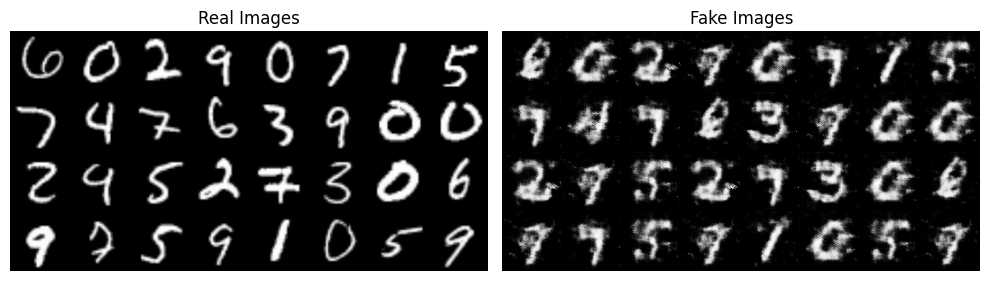

In [28]:
# Step 4: Generate and save visual results
fake = gen(fixed_noise, labels)
img_grid_real = vutils.make_grid(real[:32], normalize=True)
img_grid_fake = vutils.make_grid(fake[:32], normalize=True)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Real Images')
plt.imshow(img_grid_real.permute(1, 2, 0).cpu())
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Fake Images')
plt.imshow(img_grid_fake.permute(1, 2, 0).cpu())
plt.axis('off')

plt.tight_layout()
plt.savefig('visual_results.png')
plt.show()

In [23]:
%load_ext tensorboard
%tensorboard --logdir=logs

<IPython.core.display.Javascript object>